In [29]:
# Part 1 - Data Preprocessing
import lightgbm as lgb
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import os
import logging
import joblib

In [30]:
# read data
data = pd.read_csv('data/Dataset_SH50/600048.SH.csv', skiprows=2)
# drop default
data =data[(data != 0).all(axis=1)]
data.head()

,date,open,close,high,low,volume
0,2014/1/2,8.19,8.18,8.26,8.13,32159157
1,2014/1/3,8.13,8.11,8.20,8.05,25517581
2,2014/1/6,8.08,7.65,8.08,7.62,76409223
3,2014/1/7,7.63,7.58,7.70,7.55,40229837
4,2014/1/8,7.60,7.51,7.70,7.45,50442084


In [31]:
features = ['open', 'close', 'high', 'low', 'volume'] 
target = 'close'

X = data[features]
y = data[target]

In [32]:
# Feature Scaling
from sklearn.preprocessing import MinMaxScaler
all_data = data.iloc[:, 1:6]
sc = MinMaxScaler(feature_range = (0, 1),)
all_data_scaled = sc.fit_transform(all_data)
print(all_data_scaled)
print('Length of data:',len(all_data_scaled))

[[0.23914591 0.22959889 0.22170127 0.24       0.01961069]
 [0.23487544 0.22475795 0.21768252 0.23418182 0.0124647 ]
 [0.23131673 0.19294606 0.20964501 0.20290909 0.06722143]
 ...
 [0.33380783 0.32019364 0.31212324 0.336      0.04640368]
 [0.32953737 0.35200553 0.33757535 0.32872727 0.10666231]
 [0.36085409 0.34854772 0.34293369 0.36290909 0.06622817]]
Length of data: 2427


In [33]:
timestep = 60
features = []
labels = []

for i in range(timestep, len(all_data_scaled)):
    features.append(all_data_scaled[i-timestep:i, :])  # 收集时间步长范围内的数据作为特征
    labels.append(all_data_scaled[i, 1])  # 使用数据集中第二列（例如收盘价）作为标签
    
features, labels = np.array(features), np.array(labels)

features = features.reshape(features.shape[0], -1)

x_train, x_temp, y_train, y_temp = train_test_split(features, labels, test_size=0.2, shuffle=False)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, shuffle=False)

# 输出各个数据集的形状
print('shape of x_train:', x_train.shape)
print('shape of x_val:', x_val.shape)
print('shape of x_test:', x_test.shape)
print('shape of y_train:', y_train.shape)
print('shape of y_val:', y_val.shape)
print('shape of y_test:', y_test.shape)

shape of x_train: (1893, 300)
shape of x_val: (237, 300)
shape of x_test: (237, 300)
shape of y_train: (1893,)
shape of y_val: (237,)
shape of y_test: (237,)


In [34]:
train_data = lgb.Dataset(x_train, label=y_train)
val_data = lgb.Dataset(x_val, label=y_val, reference=train_data)

In [35]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9
}

In [36]:
gbm = lgb.train(
    params=params,
    train_set=train_data,
    num_boost_round=200,
    valid_sets=[train_data, val_data],  
    callbacks=[lgb.early_stopping(stopping_rounds=10)]
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454


In [37]:
y_pred = gbm.predict(x_test, num_iteration=gbm.best_iteration)

In [38]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
import math
##########evaluate##############

mse = mean_squared_error(y_test, y_pred)

rmse = math.sqrt(mse)

mae = mean_absolute_error(y_test, y_pred)

mape = mean_absolute_percentage_error(y_test, y_pred)

r2 = r2_score(y_test, y_pred)

# Print evaluation results
print('MSE of LGBM: %.6f' % mse)
print('RMSE of LGBM: %.6f' % rmse)
print('MAE of LGBM: %.6f' % mae)
print('MAPE of LGBM: %.6f' % mape)
print('R^2 of LGBM: %.6f' % r2)

MSE of LGBM: 0.000334
RMSE of LGBM: 0.018273
MAE of LGBM: 0.014231
MAPE of LGBM: 0.025624
R^2 of LGBM: 0.975473


In [39]:
# ------------------------------------------------------------------------------------
# LGBM

In [40]:
# Directory containing the data files
data_dir = 'data/Dataset_SH50/'
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
# List all CSV files in the data directory
csv_files = [file for file in os.listdir(data_dir) if file.endswith('.csv')]
csv_files

['600905.SH.csv',
 '600030.SH.csv',
 '600809.SH.csv',
 '600309.SH.csv',
 '601012.SH.csv',
 '600887.SH.csv',
 '603799.SH.csv',
 '600276.SH.csv',
 '600690.SH.csv',
 '603259.SH.csv',
 '601669.SH.csv',
 '688111.SH.csv',
 '601225.SH.csv',
 '600104.SH.csv',
 '600519.SH.csv',
 '603986.SH.csv',
 '600893.SH.csv',
 '601899.SH.csv',
 '601088.SH.csv',
 '600028.SH.csv',
 '600036.SH.csv',
 '603288.SH.csv',
 '601919.SH.csv',
 '601628.SH.csv',
 '601728.SH.csv',
 '600089.SH.csv',
 '601857.SH.csv',
 '600436.SH.csv',
 '601633.SH.csv',
 '688981.SH.csv',
 '600031.SH.csv',
 '600050.SH.csv',
 '600150.SH.csv',
 '601668.SH.csv',
 '688599.SH.csv',
 '601390.SH.csv',
 '600438.SH.csv',
 '603501.SH.csv',
 '688041.SH.csv',
 '601398.SH.csv',
 '600406.SH.csv',
 '601166.SH.csv',
 '601288.SH.csv',
 '601601.SH.csv',
 '600048.SH.csv',
 '600900.SH.csv',
 '600111.SH.csv',
 '601888.SH.csv',
 '601318.SH.csv']

In [41]:
# Initialize a DataFrame to store metrics for all files
metrics_summary = pd.DataFrame(columns=['File', 'MSE', 'RMSE', 'MAE', 'MAPE', 'R2'])

Processing file: 600905.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:39,806 - INFO - Model saved to 600905.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600905.SH.csv
MSE of LGBM: 0.000132
RMSE of LGBM: 0.011499
MAE of LGBM: 0.009443
MAPE of LGBM: 0.014957
R^2 of LGBM: 0.950891
--------------------------------------------------


/var/folders/ql/lzrfftss6kx4jzx89303xm980000gn/T/ipykernel_4639/1122941309.py:97: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_summary = pd.concat([metrics_summary, pd.DataFrame([{


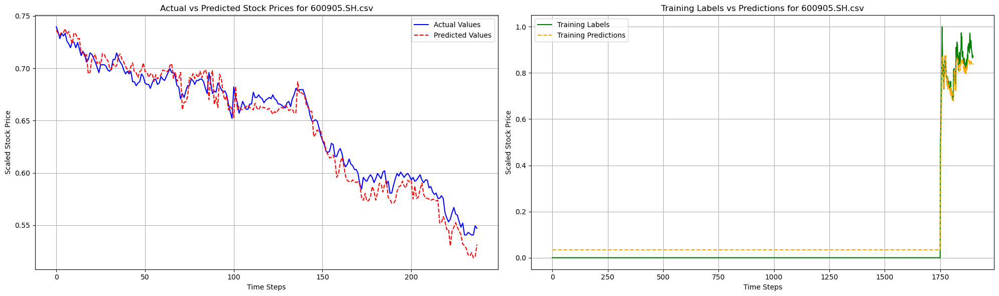

Processing file: 600030.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:40,536 - INFO - Model saved to 600030.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600030.SH.csv
MSE of LGBM: 0.000274
RMSE of LGBM: 0.016544
MAE of LGBM: 0.012776
MAPE of LGBM: 0.031216
R^2 of LGBM: 0.849080
--------------------------------------------------


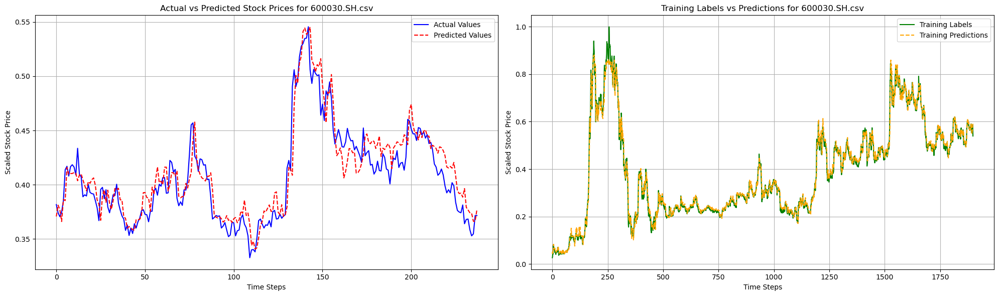

Processing file: 600809.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:41,293 - INFO - Model saved to 600809.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600809.SH.csv
MSE of LGBM: 0.000227
RMSE of LGBM: 0.015065
MAE of LGBM: 0.012224
MAPE of LGBM: 0.027020
R^2 of LGBM: 0.929104
--------------------------------------------------


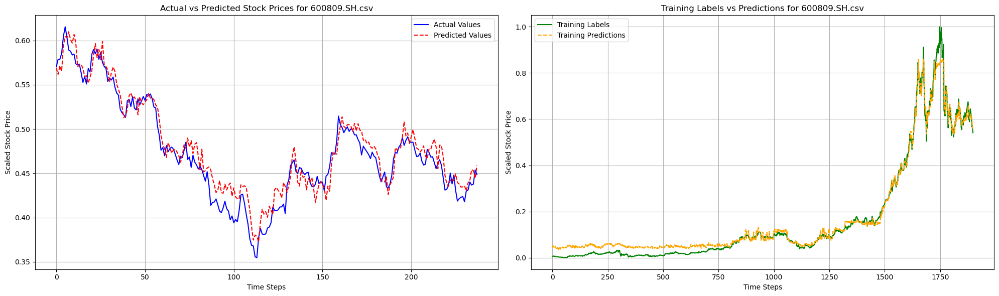

Processing file: 600309.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:42,024 - INFO - Model saved to 600309.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600309.SH.csv
MSE of LGBM: 0.000124
RMSE of LGBM: 0.011119
MAE of LGBM: 0.008831
MAPE of LGBM: 0.014894
R^2 of LGBM: 0.956655
--------------------------------------------------


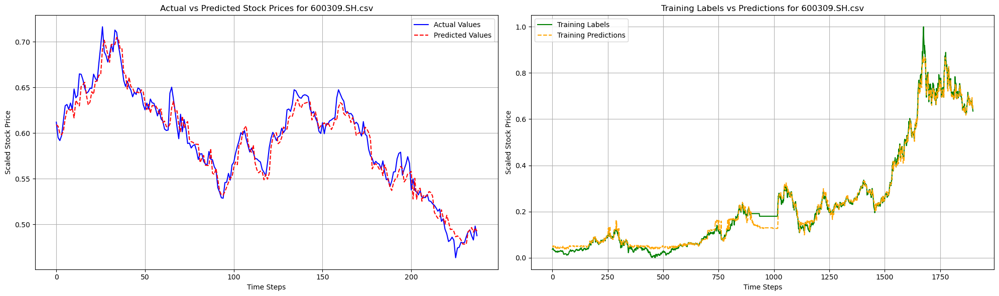

Processing file: 601012.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:42,722 - INFO - Model saved to 601012.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601012.SH.csv
MSE of LGBM: 0.000240
RMSE of LGBM: 0.015479
MAE of LGBM: 0.012295
MAPE of LGBM: 0.070544
R^2 of LGBM: 0.950524
--------------------------------------------------


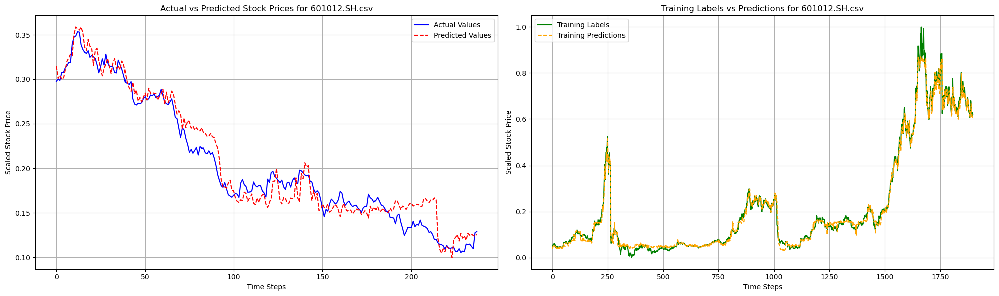

Processing file: 600887.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:43,559 - INFO - Model saved to 600887.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600887.SH.csv
MSE of LGBM: 0.000285
RMSE of LGBM: 0.016887
MAE of LGBM: 0.014102
MAPE of LGBM: 0.035350
R^2 of LGBM: 0.878592
--------------------------------------------------


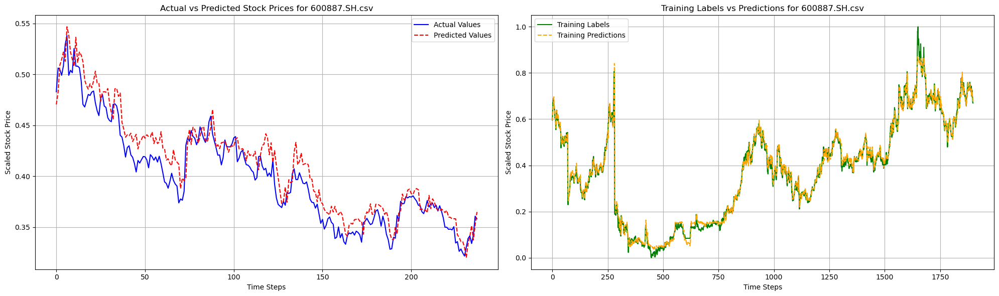

Processing file: 603799.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:44,247 - INFO - Model saved to 603799.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 603799.SH.csv
MSE of LGBM: 0.000163
RMSE of LGBM: 0.012759
MAE of LGBM: 0.010151
MAPE of LGBM: 0.032800
R^2 of LGBM: 0.963241
--------------------------------------------------


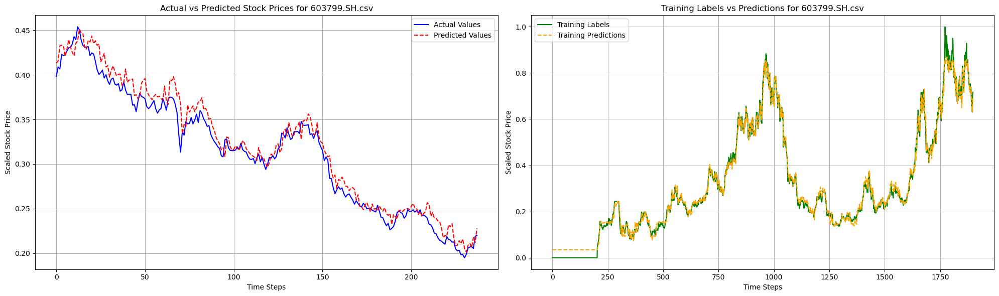

Processing file: 600276.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:45,077 - INFO - Model saved to 600276.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600276.SH.csv
MSE of LGBM: 0.000296
RMSE of LGBM: 0.017214
MAE of LGBM: 0.013167
MAPE of LGBM: 0.072997
R^2 of LGBM: 0.698406
--------------------------------------------------


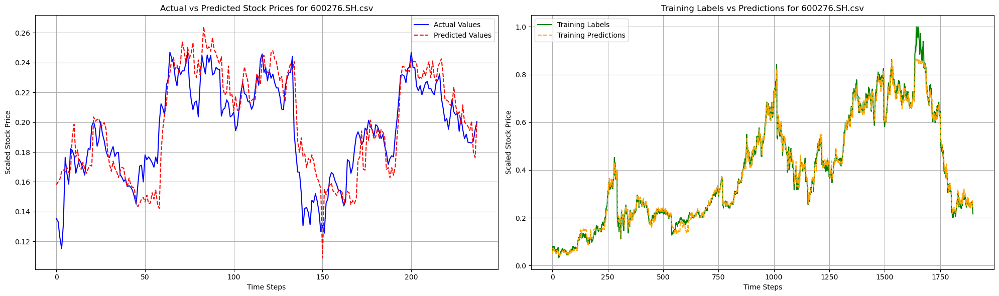

Processing file: 600690.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:45,768 - INFO - Model saved to 600690.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600690.SH.csv
MSE of LGBM: 0.000240
RMSE of LGBM: 0.015494
MAE of LGBM: 0.011657
MAPE of LGBM: 0.020425
R^2 of LGBM: 0.925161
--------------------------------------------------


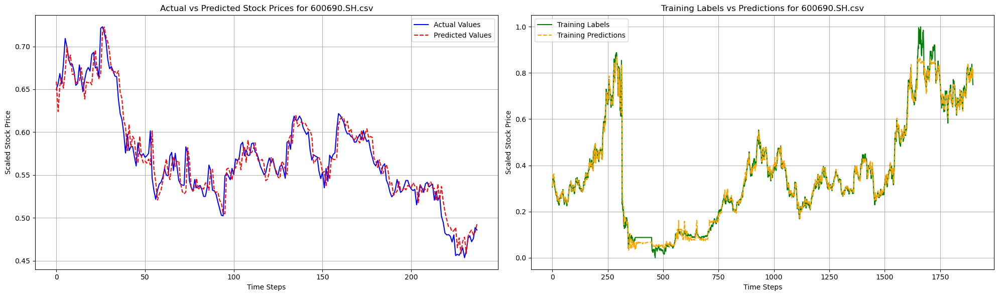

Processing file: 603259.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:46,472 - INFO - Model saved to 603259.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 603259.SH.csv
MSE of LGBM: 0.000282
RMSE of LGBM: 0.016799
MAE of LGBM: 0.013060
MAPE of LGBM: 0.031268
R^2 of LGBM: 0.874225
--------------------------------------------------


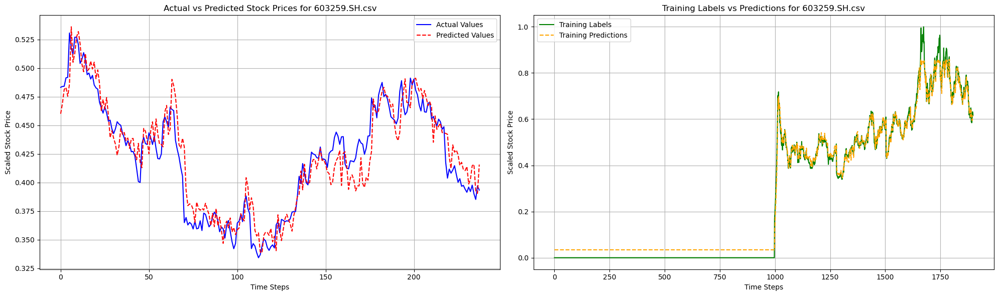

Processing file: 601669.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:47,184 - INFO - Model saved to 601669.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601669.SH.csv
MSE of LGBM: 0.000350
RMSE of LGBM: 0.018696
MAE of LGBM: 0.014218
MAPE of LGBM: 0.072984
R^2 of LGBM: 0.912753
--------------------------------------------------


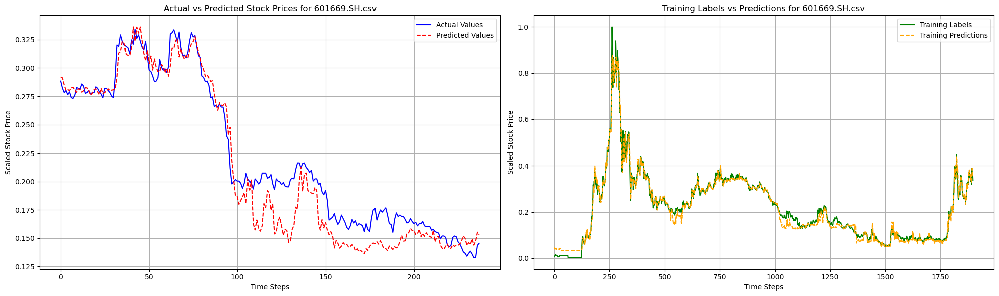

Processing file: 688111.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:47,884 - INFO - Model saved to 688111.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 688111.SH.csv
MSE of LGBM: 0.001279
RMSE of LGBM: 0.035767
MAE of LGBM: 0.024567
MAPE of LGBM: 0.032180
R^2 of LGBM: 0.918355
--------------------------------------------------


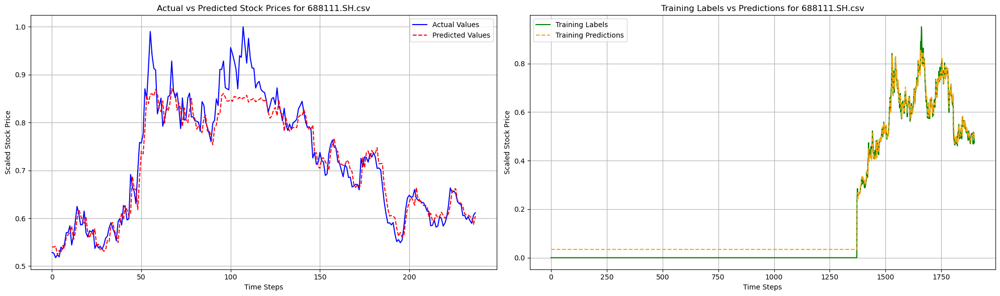

Processing file: 601225.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:48,663 - INFO - Model saved to 601225.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601225.SH.csv
MSE of LGBM: 0.000399
RMSE of LGBM: 0.019964
MAE of LGBM: 0.015679
MAPE of LGBM: 0.020879
R^2 of LGBM: 0.847350
--------------------------------------------------


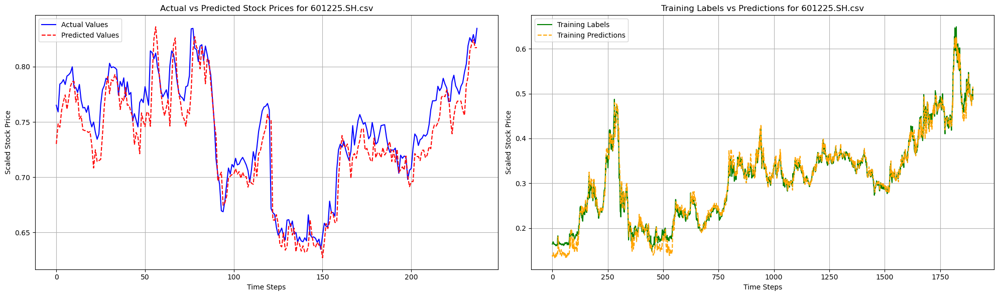

Processing file: 600104.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:49,407 - INFO - Model saved to 600104.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600104.SH.csv
MSE of LGBM: 0.000146
RMSE of LGBM: 0.012065
MAE of LGBM: 0.009308
MAPE of LGBM: 0.110964
R^2 of LGBM: 0.672425
--------------------------------------------------


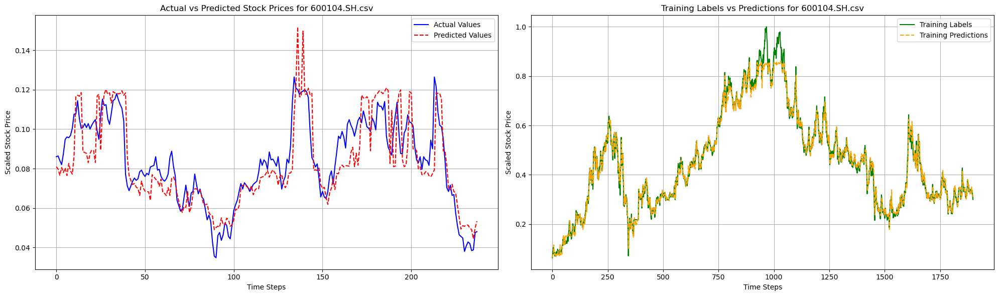

Processing file: 600519.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:50,146 - INFO - Model saved to 600519.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600519.SH.csv
MSE of LGBM: 0.000161
RMSE of LGBM: 0.012694
MAE of LGBM: 0.009859
MAPE of LGBM: 0.014816
R^2 of LGBM: 0.775394
--------------------------------------------------


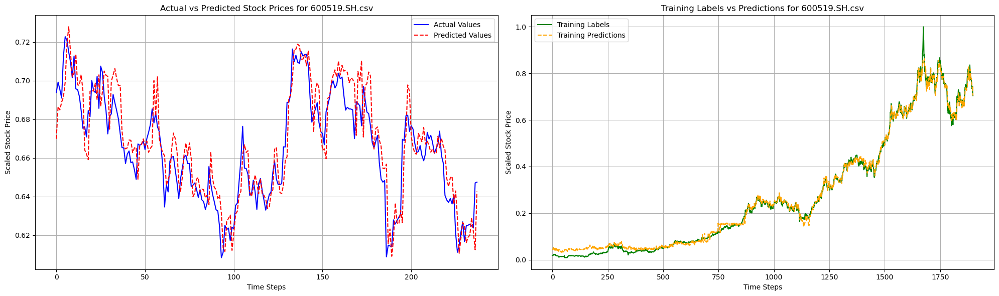

Processing file: 603986.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:50,857 - INFO - Model saved to 603986.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 603986.SH.csv
MSE of LGBM: 0.000238
RMSE of LGBM: 0.015438
MAE of LGBM: 0.012816
MAPE of LGBM: 0.051534
R^2 of LGBM: 0.591131
--------------------------------------------------


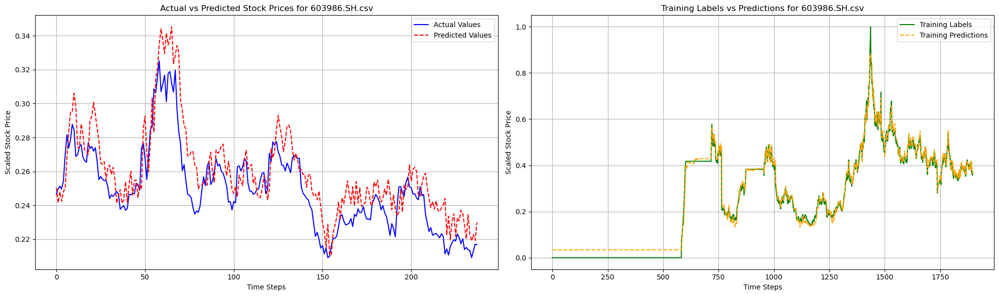

Processing file: 600893.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:51,620 - INFO - Model saved to 600893.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600893.SH.csv
MSE of LGBM: 0.000213
RMSE of LGBM: 0.014586
MAE of LGBM: 0.011527
MAPE of LGBM: 0.030750
R^2 of LGBM: 0.934828
--------------------------------------------------


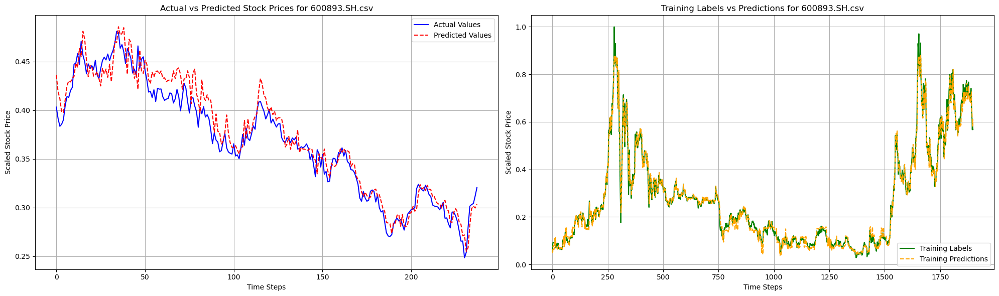

Processing file: 601899.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:52,392 - INFO - Model saved to 601899.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601899.SH.csv
MSE of LGBM: 0.000760
RMSE of LGBM: 0.027573
MAE of LGBM: 0.019996
MAPE of LGBM: 0.024657
R^2 of LGBM: 0.718559
--------------------------------------------------


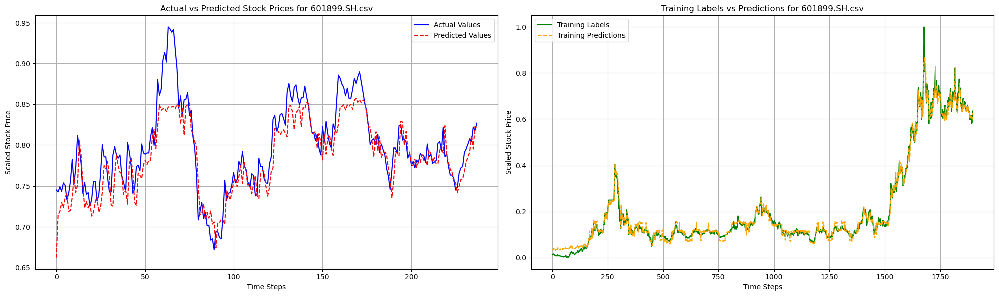

Processing file: 601088.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:53,190 - INFO - Model saved to 601088.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601088.SH.csv
MSE of LGBM: 0.000386
RMSE of LGBM: 0.019653
MAE of LGBM: 0.014458
MAPE of LGBM: 0.019597
R^2 of LGBM: 0.895751
--------------------------------------------------


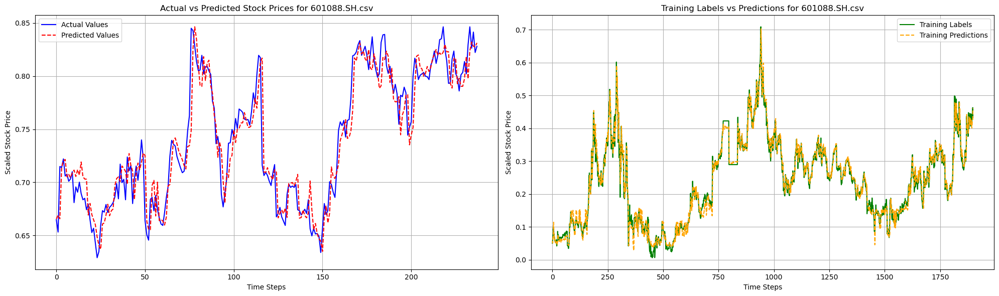

Processing file: 600028.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:54,329 - INFO - Model saved to 600028.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600028.SH.csv
MSE of LGBM: 0.000553
RMSE of LGBM: 0.023508
MAE of LGBM: 0.018256
MAPE of LGBM: 0.053918
R^2 of LGBM: 0.970568
--------------------------------------------------


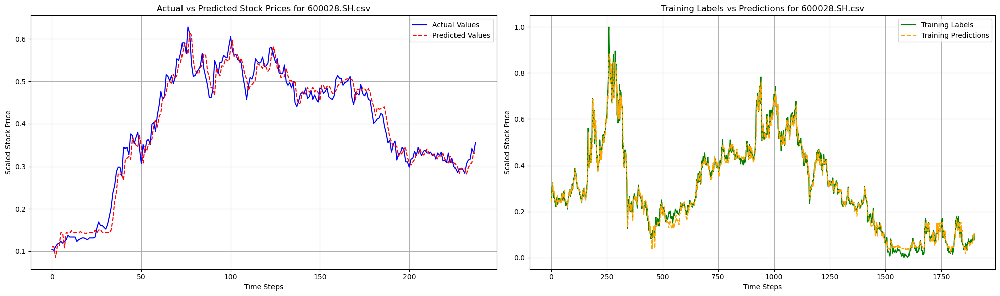

Processing file: 600036.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:55,158 - INFO - Model saved to 600036.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600036.SH.csv
MSE of LGBM: 0.000209
RMSE of LGBM: 0.014441
MAE of LGBM: 0.011705
MAPE of LGBM: 0.024667
R^2 of LGBM: 0.948059
--------------------------------------------------


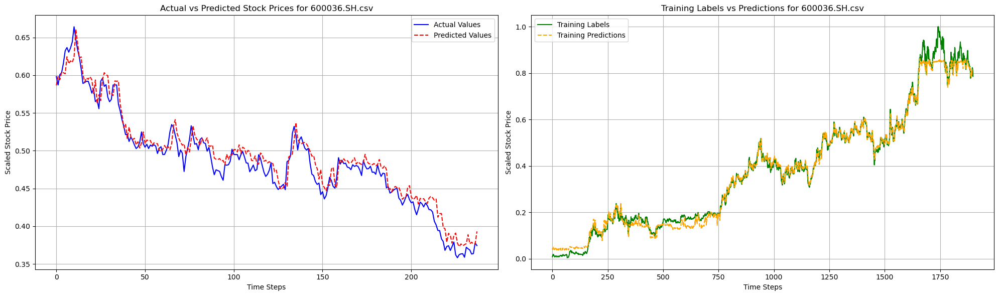

Processing file: 603288.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:55,883 - INFO - Model saved to 603288.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 603288.SH.csv
MSE of LGBM: 0.000187
RMSE of LGBM: 0.013678
MAE of LGBM: 0.011285
MAPE of LGBM: 0.053928
R^2 of LGBM: 0.970816
--------------------------------------------------


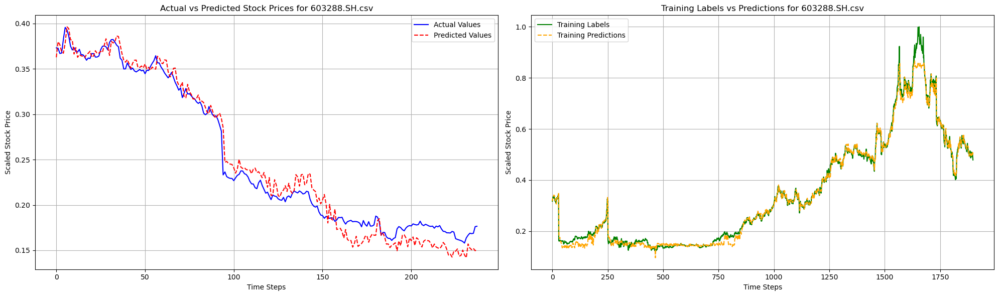

Processing file: 601919.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:56,602 - INFO - Model saved to 601919.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601919.SH.csv
MSE of LGBM: 0.000129
RMSE of LGBM: 0.011346
MAE of LGBM: 0.009386
MAPE of LGBM: 0.038931
R^2 of LGBM: 0.696381
--------------------------------------------------


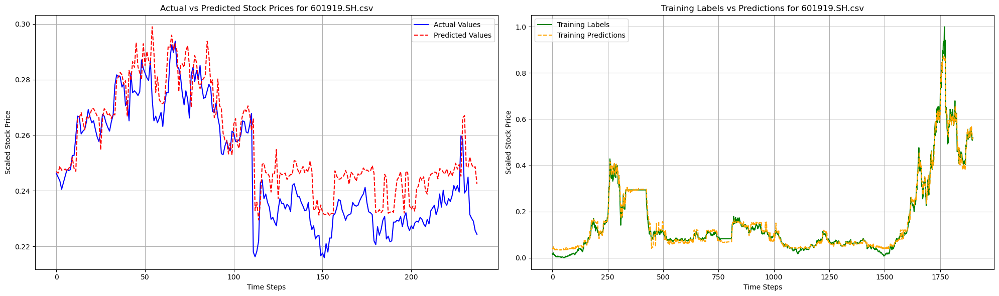

Processing file: 601628.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:57,319 - INFO - Model saved to 601628.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601628.SH.csv
MSE of LGBM: 0.000397
RMSE of LGBM: 0.019924
MAE of LGBM: 0.014986
MAPE of LGBM: 0.026866
R^2 of LGBM: 0.933340
--------------------------------------------------


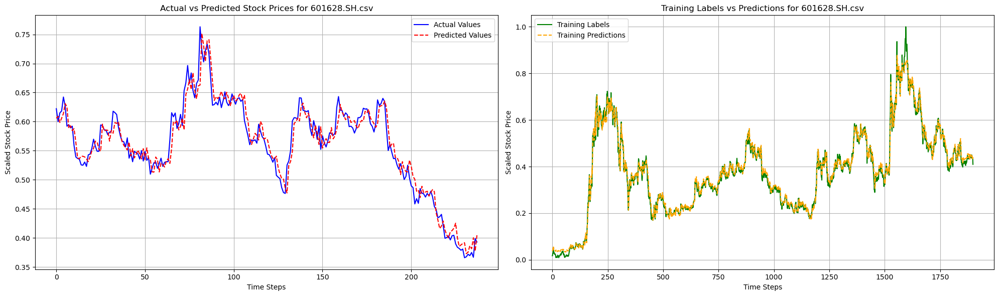

Processing file: 601728.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:58,070 - INFO - Model saved to 601728.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601728.SH.csv
MSE of LGBM: 0.001486
RMSE of LGBM: 0.038548
MAE of LGBM: 0.025247
MAPE of LGBM: 0.029651
R^2 of LGBM: 0.793364
--------------------------------------------------


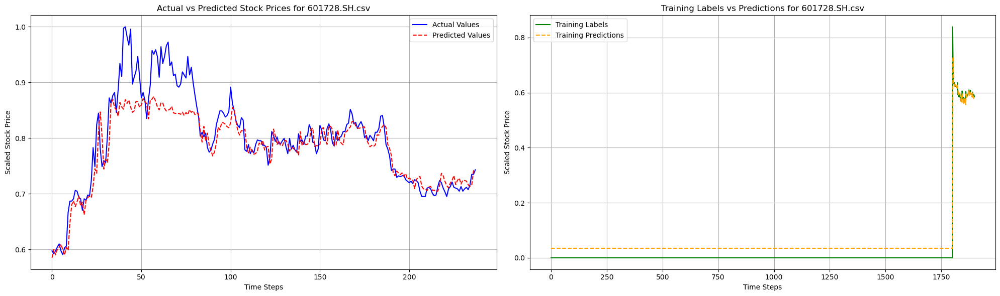

Processing file: 600089.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:58,754 - INFO - Model saved to 600089.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600089.SH.csv
MSE of LGBM: 0.000489
RMSE of LGBM: 0.022103
MAE of LGBM: 0.011523
MAPE of LGBM: 0.023675
R^2 of LGBM: 0.979018
--------------------------------------------------


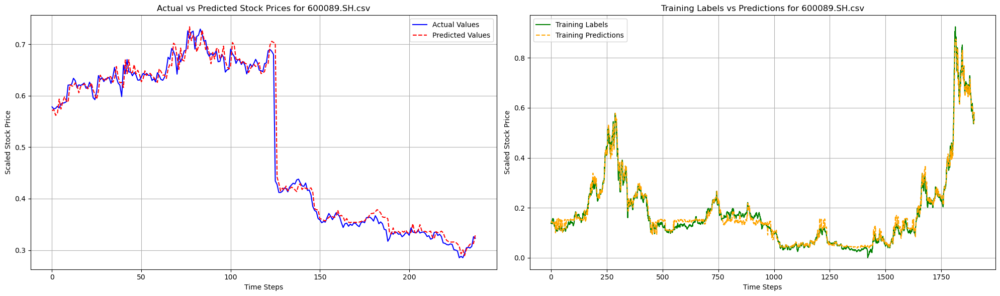

Processing file: 601857.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:30:59,440 - INFO - Model saved to 601857.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601857.SH.csv
MSE of LGBM: 0.000268
RMSE of LGBM: 0.016370
MAE of LGBM: 0.012415
MAPE of LGBM: 0.052580
R^2 of LGBM: 0.970416
--------------------------------------------------


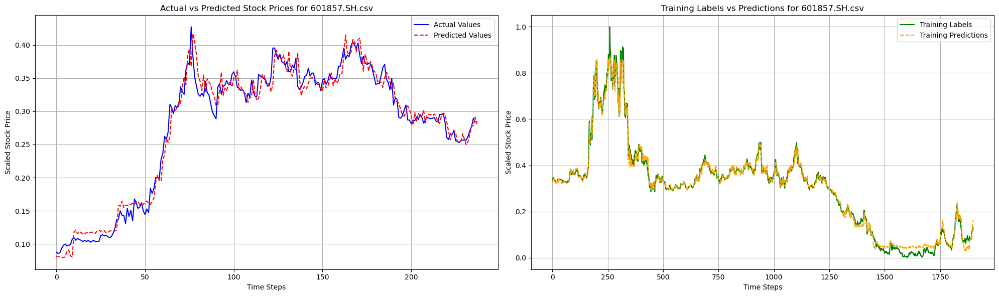

Processing file: 600436.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:00,139 - INFO - Model saved to 600436.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600436.SH.csv
MSE of LGBM: 0.000153
RMSE of LGBM: 0.012351
MAE of LGBM: 0.009623
MAPE of LGBM: 0.018296
R^2 of LGBM: 0.938180
--------------------------------------------------


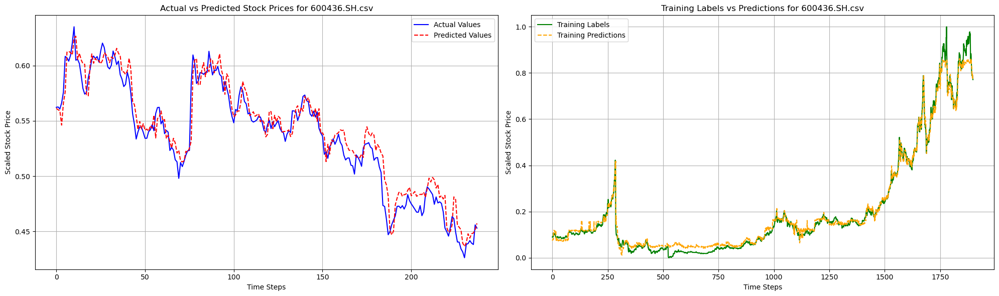

Processing file: 601633.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:00,852 - INFO - Model saved to 601633.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601633.SH.csv
MSE of LGBM: 0.000166
RMSE of LGBM: 0.012903
MAE of LGBM: 0.009707
MAPE of LGBM: 0.027347
R^2 of LGBM: 0.910847
--------------------------------------------------


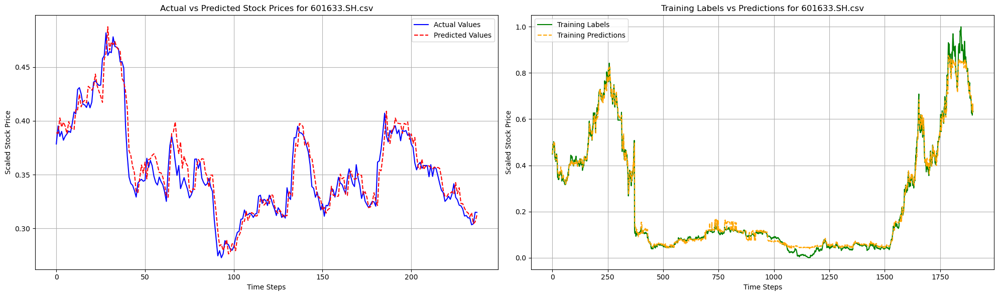

Processing file: 688981.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:01,546 - INFO - Model saved to 688981.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 688981.SH.csv
MSE of LGBM: 0.000363
RMSE of LGBM: 0.019058
MAE of LGBM: 0.013855
MAPE of LGBM: 0.022229
R^2 of LGBM: 0.904066
--------------------------------------------------


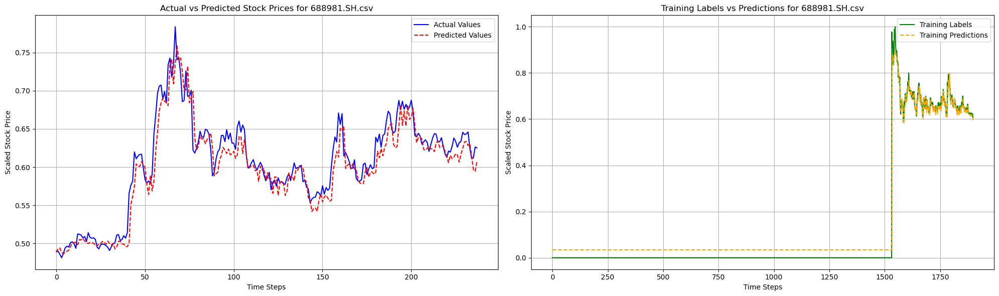

Processing file: 600031.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:02,229 - INFO - Model saved to 600031.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600031.SH.csv
MSE of LGBM: 0.000101
RMSE of LGBM: 0.010059
MAE of LGBM: 0.007180
MAPE of LGBM: 0.028595
R^2 of LGBM: 0.917134
--------------------------------------------------


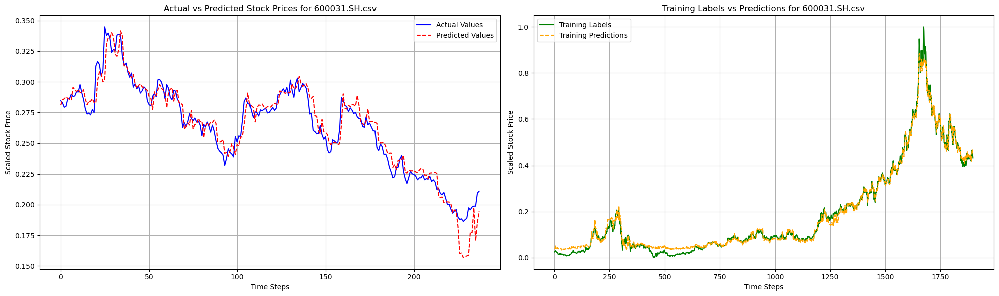

Processing file: 600050.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:03,142 - INFO - Model saved to 600050.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600050.SH.csv
MSE of LGBM: 0.000437
RMSE of LGBM: 0.020898
MAE of LGBM: 0.015860
MAPE of LGBM: 0.058378
R^2 of LGBM: 0.873738
--------------------------------------------------


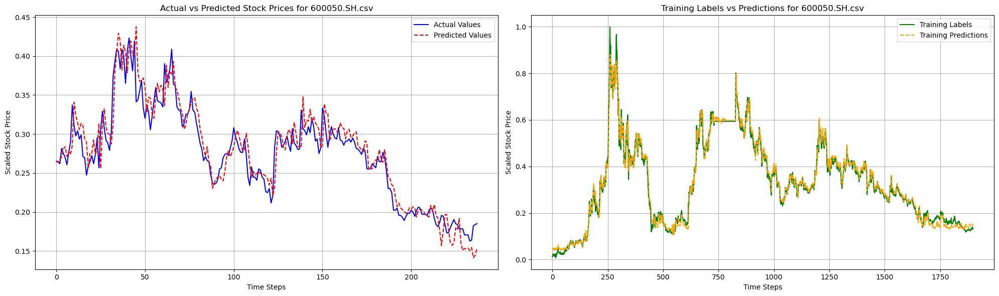

Processing file: 600150.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:03,820 - INFO - Model saved to 600150.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600150.SH.csv
MSE of LGBM: 0.000166
RMSE of LGBM: 0.012881
MAE of LGBM: 0.009768
MAPE of LGBM: 0.033061
R^2 of LGBM: 0.918583
--------------------------------------------------


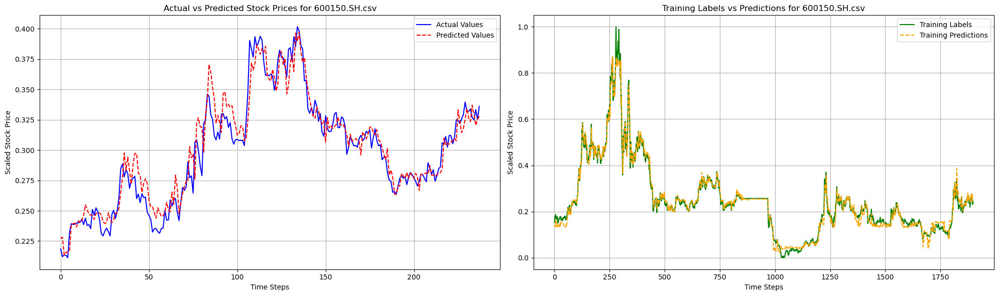

Processing file: 601668.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:04,516 - INFO - Model saved to 601668.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601668.SH.csv
MSE of LGBM: 0.000162
RMSE of LGBM: 0.012725
MAE of LGBM: 0.009604
MAPE of LGBM: 0.030259
R^2 of LGBM: 0.942277
--------------------------------------------------


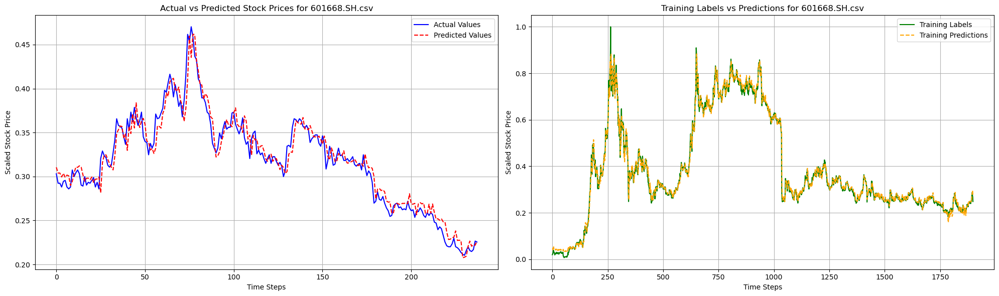

Processing file: 688599.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:05,271 - INFO - Model saved to 688599.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 688599.SH.csv
MSE of LGBM: 0.000294
RMSE of LGBM: 0.017133
MAE of LGBM: 0.013437
MAPE of LGBM: 0.030028
R^2 of LGBM: 0.987293
--------------------------------------------------


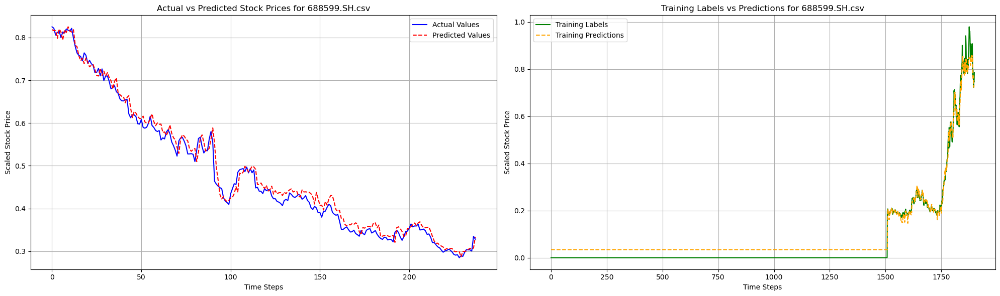

Processing file: 601390.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:06,027 - INFO - Model saved to 601390.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601390.SH.csv
MSE of LGBM: 0.000411
RMSE of LGBM: 0.020267
MAE of LGBM: 0.016516
MAPE of LGBM: 0.082681
R^2 of LGBM: 0.827945
--------------------------------------------------


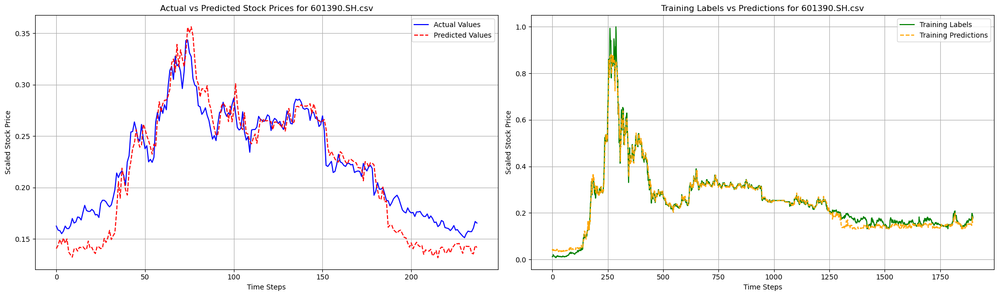

Processing file: 600438.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:06,708 - INFO - Model saved to 600438.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600438.SH.csv
MSE of LGBM: 0.000230
RMSE of LGBM: 0.015164
MAE of LGBM: 0.011967
MAPE of LGBM: 0.027563
R^2 of LGBM: 0.970830
--------------------------------------------------


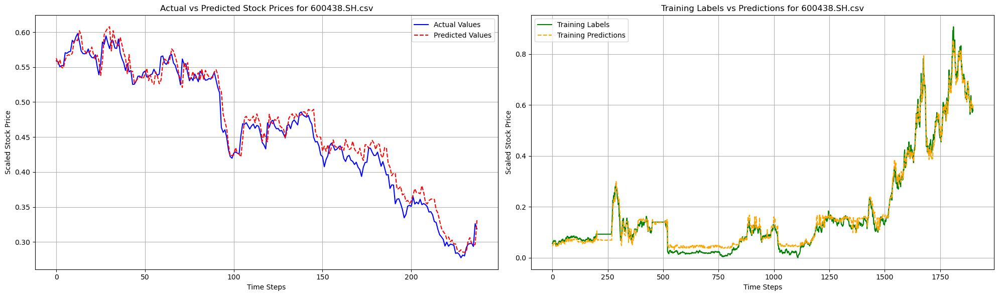

Processing file: 603501.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:07,399 - INFO - Model saved to 603501.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 603501.SH.csv
MSE of LGBM: 0.000114
RMSE of LGBM: 0.010690
MAE of LGBM: 0.008389
MAPE of LGBM: 0.029604
R^2 of LGBM: 0.773586
--------------------------------------------------


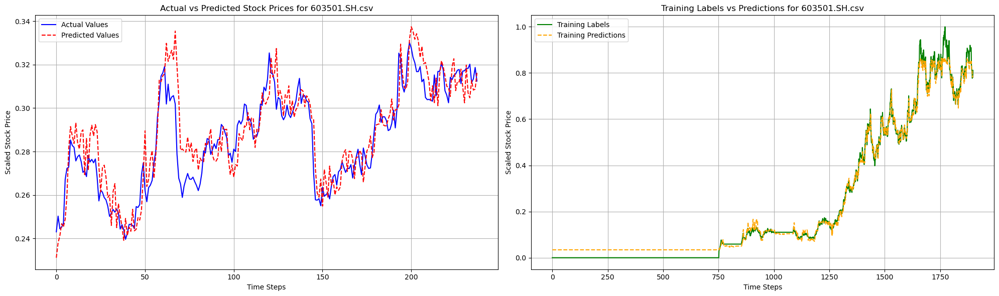

Processing file: 688041.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:08,142 - INFO - Model saved to 688041.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 688041.SH.csv
MSE of LGBM: 0.001120
RMSE of LGBM: 0.033474
MAE of LGBM: 0.023799
MAPE of LGBM: 0.034364
R^2 of LGBM: 0.937688
--------------------------------------------------


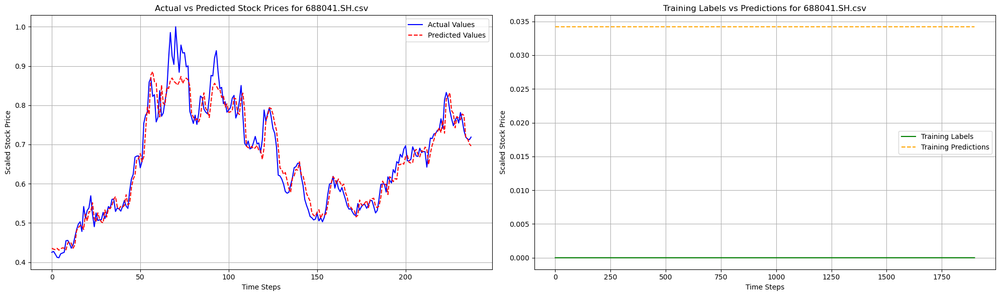

Processing file: 601398.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:08,981 - INFO - Model saved to 601398.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601398.SH.csv
MSE of LGBM: 0.000235
RMSE of LGBM: 0.015331
MAE of LGBM: 0.011557
MAPE of LGBM: 0.036320
R^2 of LGBM: 0.892825
--------------------------------------------------


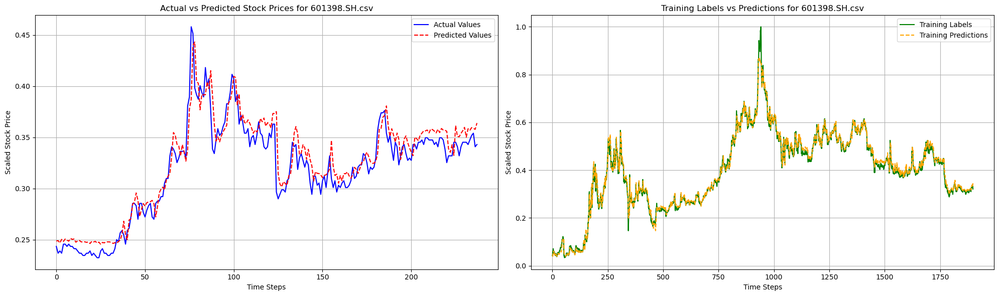

Processing file: 600406.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:09,721 - INFO - Model saved to 600406.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600406.SH.csv
MSE of LGBM: 0.000247
RMSE of LGBM: 0.015717
MAE of LGBM: 0.009772
MAPE of LGBM: 0.026806
R^2 of LGBM: 0.940631
--------------------------------------------------


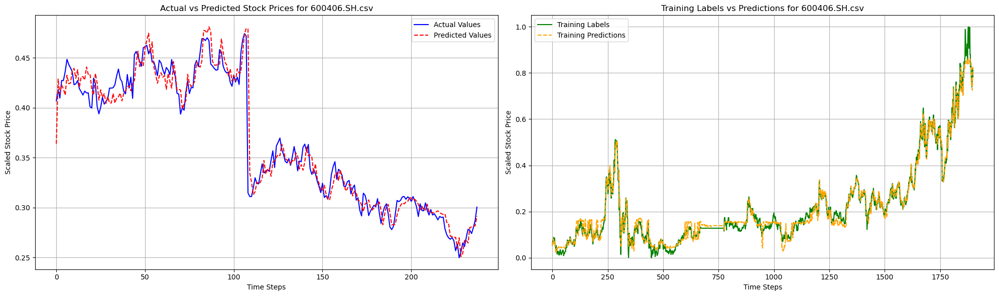

Processing file: 601166.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:10,484 - INFO - Model saved to 601166.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601166.SH.csv
MSE of LGBM: 0.000203
RMSE of LGBM: 0.014235
MAE of LGBM: 0.010765
MAPE of LGBM: 0.027433
R^2 of LGBM: 0.919219
--------------------------------------------------


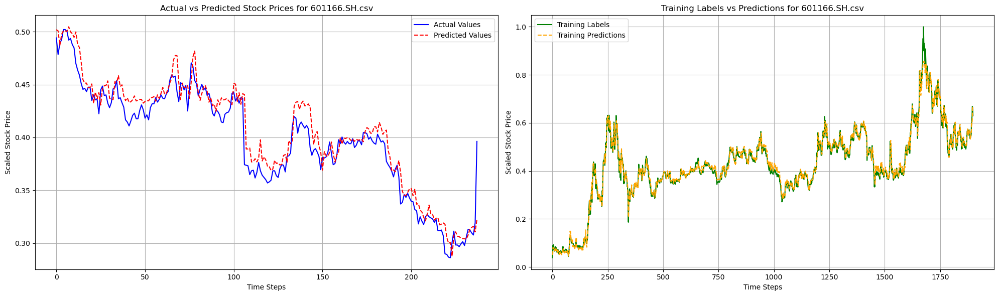

Processing file: 601288.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:11,233 - INFO - Model saved to 601288.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601288.SH.csv
MSE of LGBM: 0.000426
RMSE of LGBM: 0.020637
MAE of LGBM: 0.013803
MAPE of LGBM: 0.029781
R^2 of LGBM: 0.963511
--------------------------------------------------


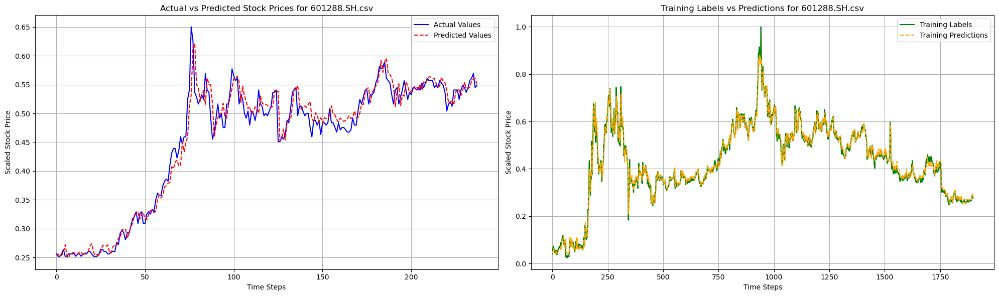

Processing file: 601601.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:12,016 - INFO - Model saved to 601601.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601601.SH.csv
MSE of LGBM: 0.000501
RMSE of LGBM: 0.022386
MAE of LGBM: 0.017058
MAPE of LGBM: 0.044031
R^2 of LGBM: 0.907058
--------------------------------------------------


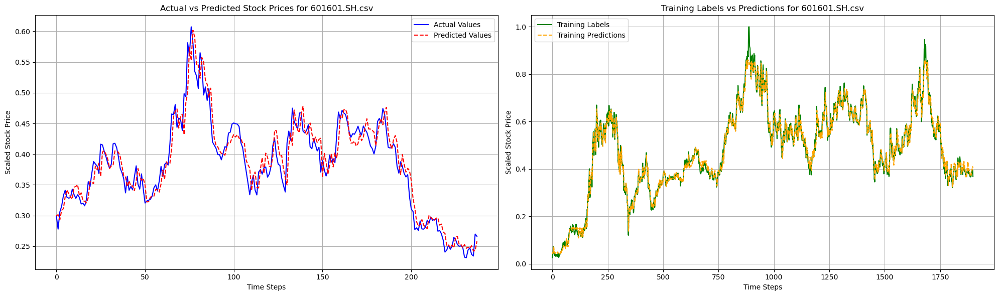

Processing file: 600048.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:12,804 - INFO - Model saved to 600048.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600048.SH.csv
MSE of LGBM: 0.000338
RMSE of LGBM: 0.018384
MAE of LGBM: 0.014310
MAPE of LGBM: 0.025773
R^2 of LGBM: 0.975309
--------------------------------------------------


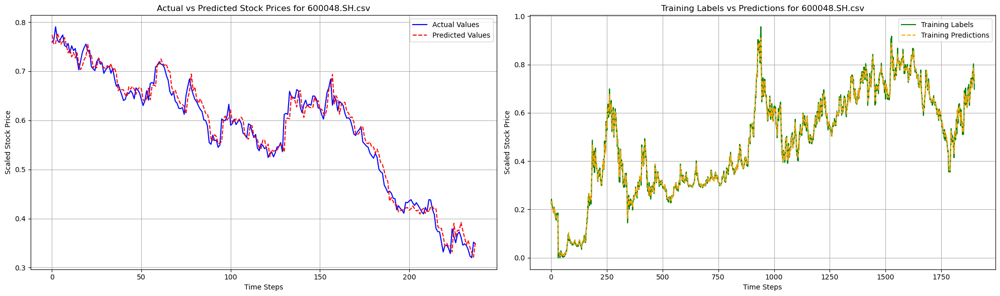

Processing file: 600900.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:13,685 - INFO - Model saved to 600900.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600900.SH.csv
MSE of LGBM: 0.000634
RMSE of LGBM: 0.025176
MAE of LGBM: 0.020665
MAPE of LGBM: 0.024112
R^2 of LGBM: 0.568785
--------------------------------------------------


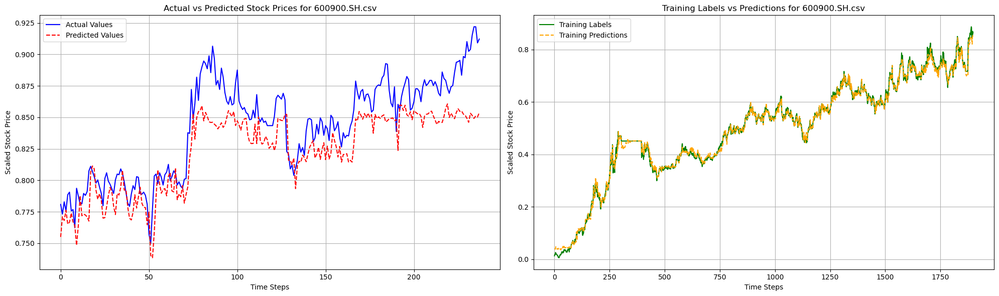

Processing file: 600111.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:14,472 - INFO - Model saved to 600111.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 600111.SH.csv
MSE of LGBM: 0.000110
RMSE of LGBM: 0.010477
MAE of LGBM: 0.008241
MAPE of LGBM: 0.028875
R^2 of LGBM: 0.963375
--------------------------------------------------


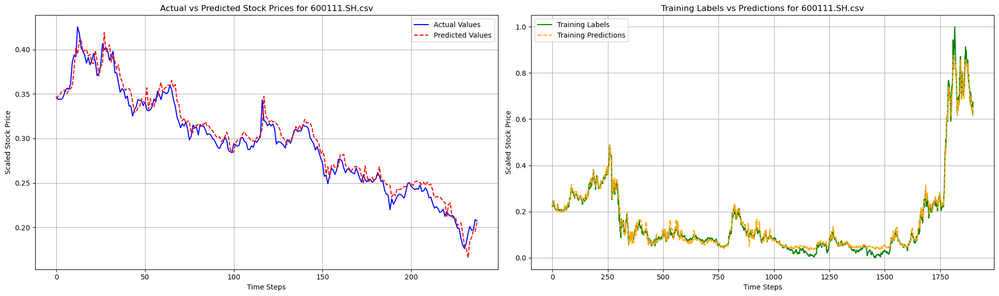

Processing file: 601888.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:15,222 - INFO - Model saved to 601888.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601888.SH.csv
MSE of LGBM: 0.000262
RMSE of LGBM: 0.016172
MAE of LGBM: 0.013582
MAPE of LGBM: 0.053481
R^2 of LGBM: 0.982133
--------------------------------------------------


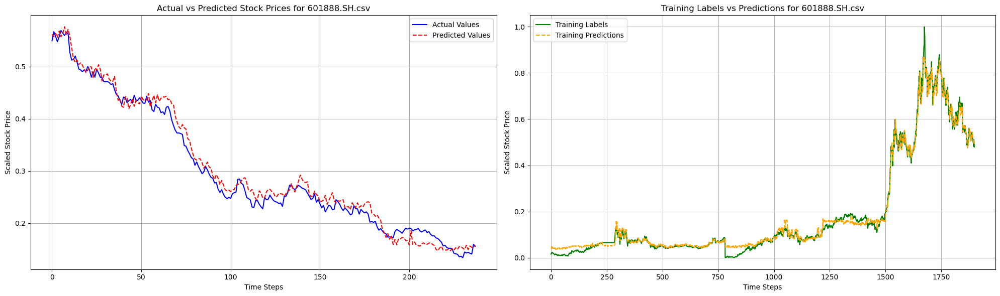

Processing file: 601318.SH.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 1893, number of used features: 300
[LightGBM] [Info] Start training from score 0.479219
Training until validation scores don't improve for 10 rounds


2024-12-01 00:31:16,027 - INFO - Model saved to 601318.SH.csv_lgbm_model.pkl


Early stopping, best iteration is:
[139]	training's rmse: 0.00900116	valid_1's rmse: 0.039454
File: 601318.SH.csv
MSE of LGBM: 0.000226
RMSE of LGBM: 0.015021
MAE of LGBM: 0.011185
MAPE of LGBM: 0.035878
R^2 of LGBM: 0.916650
--------------------------------------------------


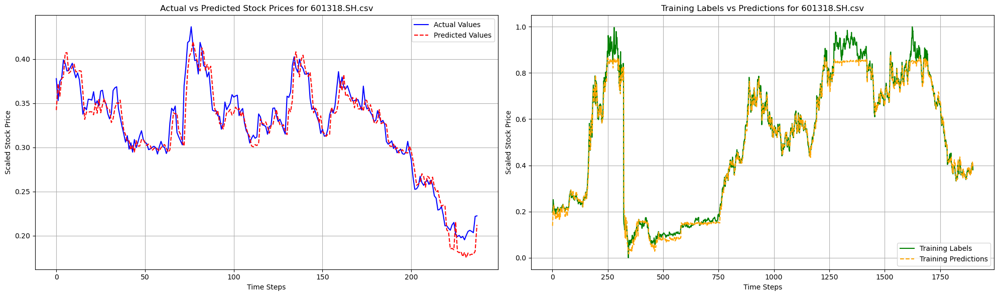

In [42]:
# Loop through each file and process it
valid_csv_files = []
for csv_file in csv_files:
    print(f'Processing file: {csv_file}')
    
    # Load the dataset
    data = pd.read_csv(os.path.join(data_dir, csv_file))

    # Drop the first two rows that contain non-relevant information
    if len(data) > 2:
        data_cleaned = data.drop([0, 1])
    else:
        data_cleaned = data

    # Reset index
    data_cleaned.reset_index(drop=True, inplace=True)

    # Convert columns to numeric where possible
    data_cleaned = data_cleaned.apply(pd.to_numeric, errors='coerce')

    # # Calculate the percentage of missing values in each column
    # missing_percentage = (data_cleaned.isna() | (data_cleaned == 0)).mean() * 100
    # 
    # # If the percentage of missing values is greater than a threshold (e.g., 30%), skip this file
    # if missing_percentage.mean() > 25:
    #     logging.warning(f'File {csv_file} has too many missing values (average missing rate: {missing_percentage.mean():.2f}%). Skipping file.')
    #     continue

    # If dropping rows with NaN values results in insufficient data, skip the cleaning step
    if data_cleaned.dropna().shape[0] >= 60:
        data_cleaned.dropna(inplace=True)

    # Select features for scaling (assuming columns 1 to 5 are relevant features)
    all_data = data_cleaned.iloc[:, 1:6]

    if all_data.shape[1] < 5:
        logging.warning(f'File {csv_file} has insufficient numeric columns for processing. Skipping file.')
        continue

    valid_csv_files.append(csv_file)
    
    # Feature scaling using MinMaxScaler
    sc = MinMaxScaler(feature_range=(0, 1))
    all_data_scaled = sc.fit_transform(all_data)

    # Prepare features and labels with a time step of 60
    timestep = 60
    features = []
    labels = []
    for i in range(timestep, len(all_data_scaled)):
        features.append(all_data_scaled[i-timestep:i, :])
        labels.append(all_data_scaled[i, 1])  # Using the second column as the label

    features, labels = np.array(features), np.array(labels)

    # Reshape features for linear regression (flattening)
    features = features.reshape(features.shape[0], -1)

    # Split the dataset into training, validation, and test sets (8:1:1 ratio)
    x_train, x_temp, y_train, y_temp = train_test_split(features, labels, test_size=0.2, shuffle=False)
    x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, shuffle=False)

    # Train model
    params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9
}
    
    gbm = lgb.train(
    params=params,
    train_set=train_data,
    num_boost_round=200,
    valid_sets=[train_data, val_data],  
    callbacks=[lgb.early_stopping(stopping_rounds=10)]
)

    # Save the trained model
    model_filename = f'{csv_file}_lgbm_model.pkl'
    joblib.dump(gbm, os.path.join(data_dir, model_filename))
    logging.info(f'Model saved to {model_filename}')

    # Predict on test set
    if len(y_test) > 0:  # Only proceed if there is test data
        predicted_stock_test = gbm.predict(x_test, num_iteration=gbm.best_iteration)
        # Calculate evaluation metrics
        mse = mean_squared_error(y_test, predicted_stock_test)
        rmse = math.sqrt(mse)
        mae = mean_absolute_error(y_test, predicted_stock_test)
        mape = mean_absolute_percentage_error(y_test, predicted_stock_test)
        r2 = r2_score(y_test, predicted_stock_test)

        # Add metrics to summary DataFrame
        metrics_summary = pd.concat([metrics_summary, pd.DataFrame([{
            'File': csv_file,
            'MSE': mse,
            'RMSE': rmse,
            'MAE': mae,
            'MAPE': mape,
            'R2': r2
        }])], ignore_index=True)

        # Print evaluation results
        print(f'File: {csv_file}')
        print('MSE of LGBM: %.6f' % mse)
        print('RMSE of LGBM: %.6f' % rmse)
        print('MAE of LGBM: %.6f' % mae)
        print('MAPE of LGBM: %.6f' % mape)
        print('R^2 of LGBM: %.6f' % r2)
        print('-' * 50)

        # Data Visualization
        # Plotting Actual vs Predicted values and Training vs Predictions in one row
        fig, axs = plt.subplots(1, 2, figsize=(20, 6))
        
        # Plotting the Actual vs Predicted values
        axs[0].plot(y_test, color='blue', label='Actual Values')
        axs[0].plot(predicted_stock_test, color='red', linestyle='--', label='Predicted Values')
        axs[0].set_title(f'Actual vs Predicted Stock Prices for {csv_file}')
        axs[0].set_xlabel('Time Steps')
        axs[0].set_ylabel('Scaled Stock Price')
        axs[0].legend()
        axs[0].grid(True)
        
        # Plotting Training and Validation Loss
        axs[1].plot(y_train, color='green', label='Training Labels')
        axs[1].plot(gbm.predict(x_train), color='orange', linestyle='--', label='Training Predictions')
        axs[1].set_title(f'Training Labels vs Predictions for {csv_file}')
        axs[1].set_xlabel('Time Steps')
        axs[1].set_ylabel('Scaled Stock Price')
        axs[1].legend()
        axs[1].grid(True)
        
        # Show the combined figure
        plt.tight_layout()
        plt.show()

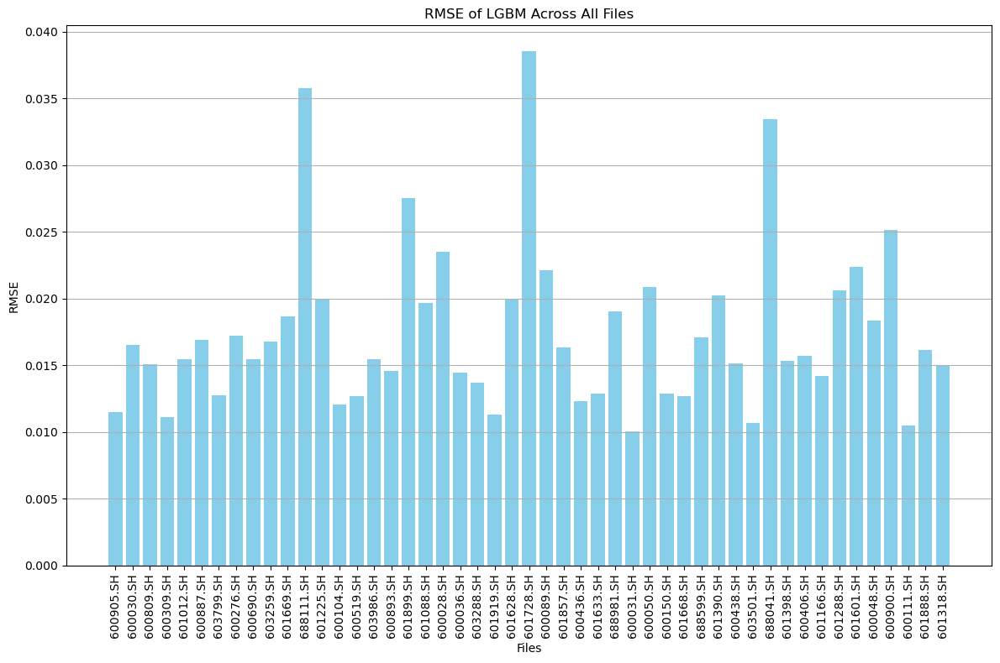

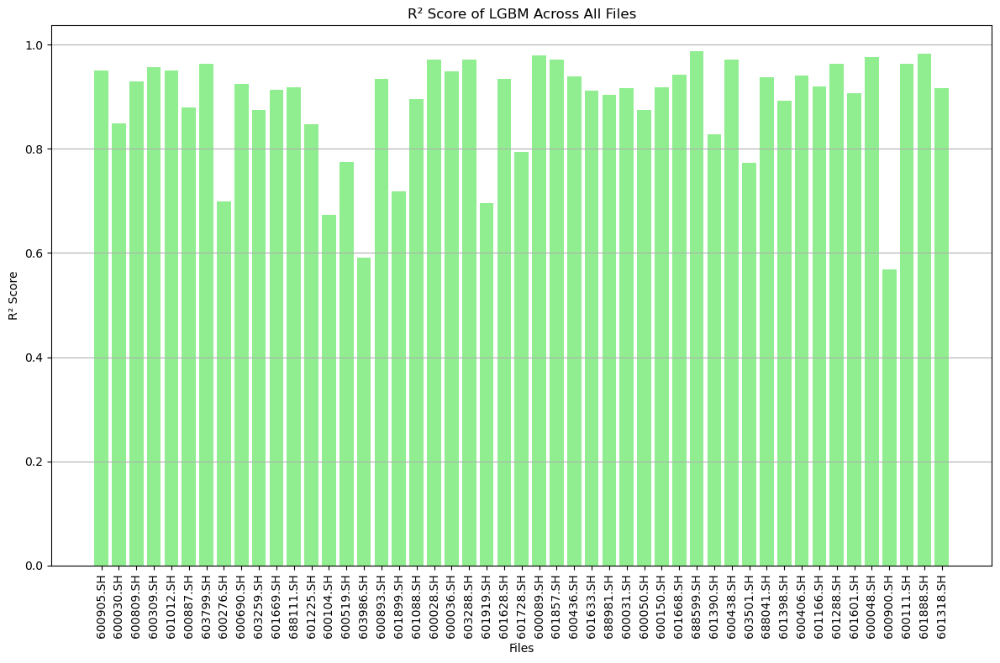

In [45]:
# Overall Data Analysis
# Plotting summary metrics for all files

metrics_summary['File'] = metrics_summary['File'].str.replace('.csv', '', regex=False)

if not metrics_summary.empty:
    plt.figure(figsize=(12, 8))
    plt.bar(metrics_summary['File'], metrics_summary['RMSE'], color='skyblue')
    plt.title('RMSE of LGBM Across All Files')
    plt.xlabel('Files')
    plt.ylabel('RMSE')
    plt.xticks(rotation=90)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 8))
    plt.bar(metrics_summary['File'], metrics_summary['R2'], color='lightgreen')
    plt.title('R² Score of LGBM Across All Files')
    plt.xlabel('Files')
    plt.ylabel('R² Score')
    plt.xticks(rotation=90)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()